In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')
from google.colab import files
files.upload()


Saving BIKE DETAILS.csv to BIKE DETAILS.csv


{'BIKE DETAILS.csv': b"name,selling_price,year,seller_type,owner,km_driven,ex_showroom_price\r\nRoyal Enfield Classic 350,175000,2019,Individual,1st owner,350,\r\nHonda Dio,45000,2017,Individual,1st owner,5650,\r\nRoyal Enfield Classic Gunmetal Grey,150000,2018,Individual,1st owner,12000,148114\r\nYamaha Fazer FI V 2.0 [2016-2018],65000,2015,Individual,1st owner,23000,89643\r\nYamaha SZ [2013-2014],20000,2011,Individual,2nd owner,21000,\r\nHonda CB Twister,18000,2010,Individual,1st owner,60000,53857\r\nHonda CB Hornet 160R,78500,2018,Individual,1st owner,17000,87719\r\nRoyal Enfield Bullet 350 [2007-2011],180000,2008,Individual,2nd owner,39000,\r\nHero Honda CBZ extreme,30000,2010,Individual,1st owner,32000,\r\nBajaj Discover 125,50000,2016,Individual,1st owner,42000,60122\r\nYamaha FZ16,35000,2015,Individual,1st owner,32000,78712\r\nHonda Navi,28000,2016,Individual,2nd owner,10000,47255\r\nBajaj Avenger Street 220,80000,2018,Individual,1st owner,21178,95955\r\nYamaha YZF R3,365000,201

In [ ]:
df = pd.read_csv("BIKE DETAILS.csv") # range of selling prices in the dataset
df['selling_price'].min(), df['selling_price'].max()



(5000, 760000)

In [ ]:
df['selling_price'].median() # median selling price for bikes in the dataset


45000.0

In [ ]:
df['seller_type'].mode()[0] #  most common seller type


'Individual'

In [ ]:
(df['km_driven'] > 50000).sum() #bikes have driven more than 50,000 kilometers


np.int64(170)

In [ ]:
df.groupby('owner')['km_driven'].mean() #average km_driven value for each ownership type


,km_driven
owner,
1st owner,32816.583333
2nd owner,39288.991870
3rd owner,33292.181818
4th owner,311500.000000


In [ ]:
(df['year'] <= 2015).mean() # What proportion of bikes are from the year 2015 or older


np.float64(0.5664467483506126)

In [ ]:
df.isnull().sum() #What is the trend of missing values across the dataset


,0
name,0
selling_price,0
year,0
seller_type,0
owner,0
km_driven,0
ex_showroom_price,435


In [ ]:
#What is the highest ex_showroom_price recorded, and for which bike
df.loc[df['ex_showroom_price'].idxmax()][['name','ex_showroom_price']]



,134
name,Harley-Davidson Street Bob
ex_showroom_price,1278000.0


In [ ]:
#What is the total number of bikes listed by each seller type
df['seller_type'].value_counts()


,count
seller_type,
Individual,1055
Dealer,6


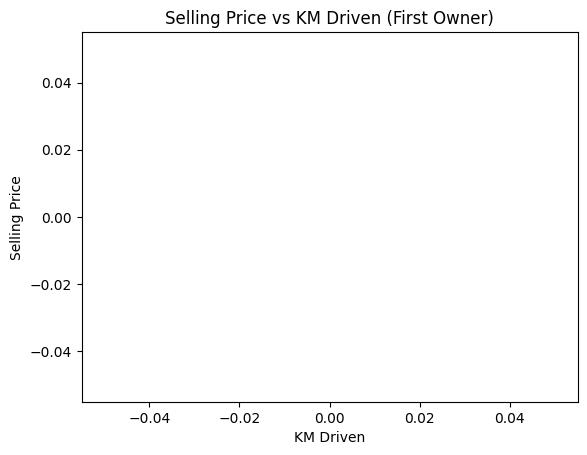

In [ ]:
#What is the relationship between selling_price and km_driven for first-owner bikes
first_owner = df[df['owner'] == 'First Owner']

plt.scatter(first_owner['km_driven'], first_owner['selling_price'])
plt.xlabel('KM Driven')
plt.ylabel('Selling Price')
plt.title('Selling Price vs KM Driven (First Owner)')
plt.show()


In [ ]:
# Identify and remove outliers in the km_driven column using the IQR method
Q1 = df['km_driven'].quantile(0.25)
Q3 = df['km_driven'].quantile(0.75)
IQR = Q3 - Q1

df_no_outliers = df[(df['km_driven'] >= Q1 - 1.5*IQR) &
                    (df['km_driven'] <= Q3 + 1.5*IQR)]


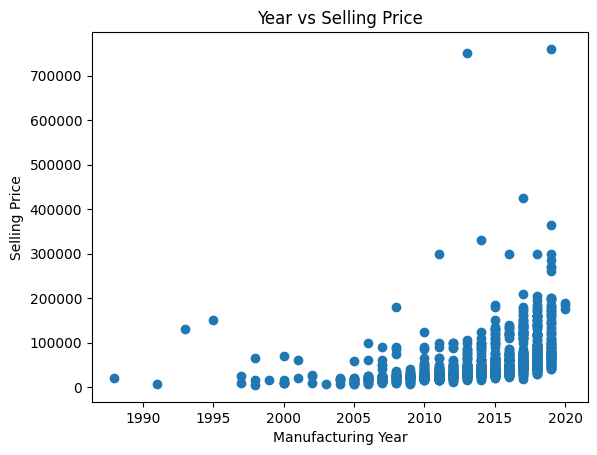

In [ ]:
# Perform a bivariate analysis to visualize the relationship between year and selling_price
plt.scatter(df['year'], df['selling_price'])
plt.xlabel('Manufacturing Year')
plt.ylabel('Selling Price')
plt.title('Year vs Selling Price')
plt.show()


In [ ]:
#What is the average depreciation in selling price based on the bike's age (current year - manufacturing
year)
current_year = 2025
df['age'] = current_year - df['year']

df.groupby('age')['selling_price'].mean()


,selling_price
age,
5,183333.333333
6,119689.511628
7,87660.374046
8,78894.736842
9,58469.018692
10,56500.000000
11,48668.131868
12,51136.986301
13,35748.400000


In [ ]:
#Which bike names are priced significantly above the average price for their manufacturing year
year_avg = df.groupby('year')['selling_price'].mean()
df['year_avg_price'] = df['year'].map(year_avg)

df[df['selling_price'] > 1.5 * df['year_avg_price']][['name','year','selling_price']]


,name,year,selling_price
2,Royal Enfield Classic Gunmetal Grey,2018,150000
7,Royal Enfield Bullet 350 [2007-2011],2008,180000
13,Yamaha YZF R3,2019,365000
18,Royal Enfield Classic Gunmetal Grey,2018,150000
23,Jawa Standard,2019,180000
...,...,...,...
979,Royal Enfield Thunder 500,2015,105000
981,Royal Enfield Thunder 350,2013,105000
983,Royal Enfield Classic 350,2015,100000
984,Royal Enfield Classic 500,2014,95000


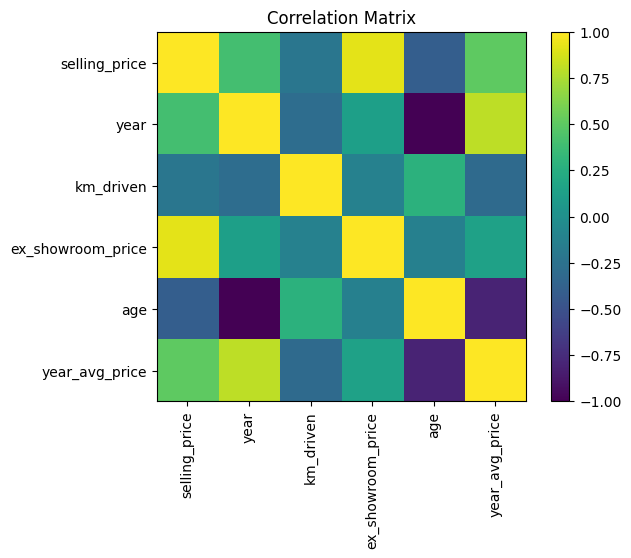

In [ ]:
# Develop a correlation matrix for numeric columns and visualize it using a heatmap.
corr = df.select_dtypes(include=np.number).corr()

plt.imshow(corr)
plt.xticks(range(len(corr.columns)), corr.columns, rotation=90)
plt.yticks(range(len(corr.columns)), corr.columns)
plt.colorbar()
plt.title('Correlation Matrix')
plt.show()


2. Car sale dataset

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')
from google.colab import files
files.upload()



Saving Car Sale.csv to Car Sale.csv


{'Car Sale.csv': b"Car_id,Date,Customer Name,Gender,Annual Income,Dealer_Name,Company,Model,Engine,Transmission,Color,Price ($),Dealer_No ,Body Style,Phone,Dealer_Region\r\nC_CND_000001,1/2/2022,Geraldine,Male,13500,Buddy Storbeck's Diesel Service Inc,Ford,Expedition,Double\xc3\x82\xc2\xa0Overhead Camshaft,Auto,Black,26000,06457-3834,SUV,8264678,Middletown\r\nC_CND_000002,1/2/2022,Gia,Male,1480000,C & M Motors Inc,Dodge,Durango,Double\xc3\x82\xc2\xa0Overhead Camshaft,Auto,Black,19000,60504-7114,SUV,6848189,Aurora\r\nC_CND_000003,1/2/2022,Gianna,Male,1035000,Capitol KIA,Cadillac,Eldorado,Overhead Camshaft,Manual,Red,31500,38701-8047,Passenger,7298798,Greenville\r\nC_CND_000004,1/2/2022,Giselle,Male,13500,Chrysler of Tri-Cities,Toyota,Celica,Overhead Camshaft,Manual,Pale White,14000,99301-3882,SUV,6257557,Pasco\r\nC_CND_000005,1/2/2022,Grace,Male,1465000,Chrysler Plymouth,Acura,TL,Double\xc3\x82\xc2\xa0Overhead Camshaft,Auto,Red,24500,53546-9427,Hatchback,7081483,Janesville\r\nC_CND_0000

In [ ]:
df = pd.read_csv("Car Sale.csv")
df.head()

,Car_id,Date,Customer Name,Gender,Annual Income,Dealer_Name,Company,Model,Engine,Transmission,Color,Price ($),Dealer_No,Body Style,Phone,Dealer_Region
0,C_CND_000001,1/2/2022,Geraldine,Male,13500,Buddy Storbeck's Diesel Service Inc,Ford,Expedition,DoubleÂ Overhead Camshaft,Auto,Black,26000,06457-3834,SUV,8264678,Middletown
1,C_CND_000002,1/2/2022,Gia,Male,1480000,C & M Motors Inc,Dodge,Durango,DoubleÂ Overhead Camshaft,Auto,Black,19000,60504-7114,SUV,6848189,Aurora
2,C_CND_000003,1/2/2022,Gianna,Male,1035000,Capitol KIA,Cadillac,Eldorado,Overhead Camshaft,Manual,Red,31500,38701-8047,Passenger,7298798,Greenville
3,C_CND_000004,1/2/2022,Giselle,Male,13500,Chrysler of Tri-Cities,Toyota,Celica,Overhead Camshaft,Manual,Pale White,14000,99301-3882,SUV,6257557,Pasco
4,C_CND_000005,1/2/2022,Grace,Male,1465000,Chrysler Plymouth,Acura,TL,DoubleÂ Overhead Camshaft,Auto,Red,24500,53546-9427,Hatchback,7081483,Janesville


In [ ]:
dealer_avg_price = df.groupby('Dealer_Name')['Price ($)'].mean().sort_values(ascending=False)
dealer_avg_price

#What is the average selling price of cars for each dealer, and how does it compare across different dealers


,Price ($)
Dealer_Name,
U-Haul CO,28769.919006
Classic Chevy,28602.014446
Rabun Used Car Sales,28527.536177
Iceberg Rentals,28522.958533
Enterprise Rent A Car,28312.580800
Scrivener Performance Engineering,28297.371589
Gartner Buick Hyundai Saab,28247.621019
Saab-Belle Dodge,28190.139888
Capitol KIA,28189.703822


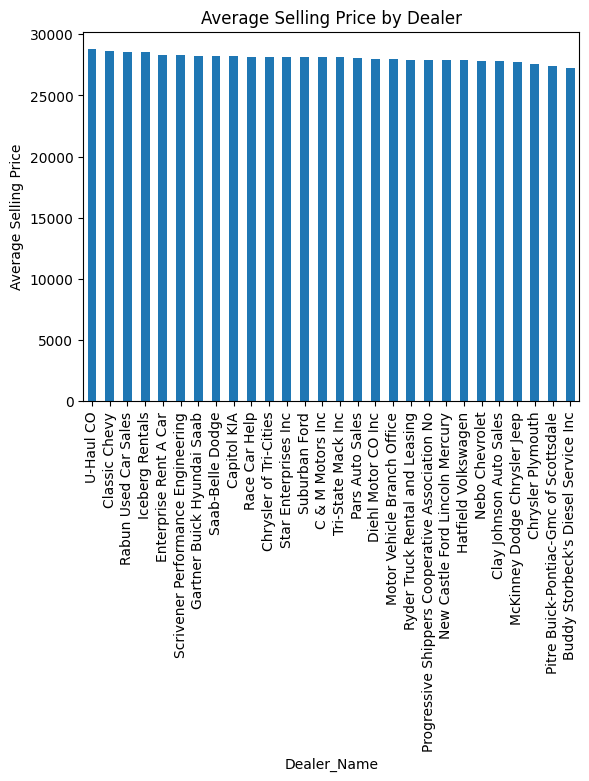

In [ ]:
plt.figure()
dealer_avg_price.plot(kind='bar')
plt.ylabel("Average Selling Price")
plt.title("Average Selling Price by Dealer")
plt.show()


In [ ]:
brand_price_variation = df.groupby('Company')['Price ($)'].std().sort_values(ascending=False)
brand_price_variation.head()

# Which car brand (Company) has the highest variation in prices,and what does this tell us about the pricing
# trends


,Price ($)
Company,
Lincoln,19658.050211
Saab,19653.740089
Cadillac,19517.120220
Plymouth,19065.997338
Lexus,17852.923492


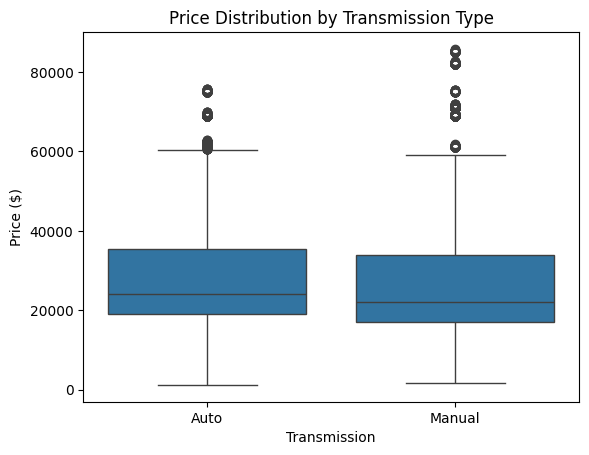

In [ ]:
#What is the distribution of car prices for each transmission type, and how do the interquartile ranges
# compare ?

plt.figure()
sns.boxplot(x='Transmission', y='Price ($)', data=df)
plt.title("Price Distribution by Transmission Type")
plt.show()


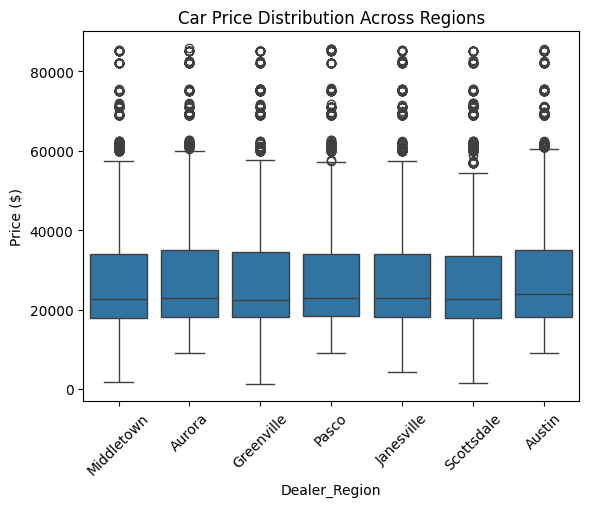

In [ ]:
# What is the distribution of car prices across different regions
plt.figure()
sns.boxplot(x='Dealer_Region', y='Price ($)', data=df)
plt.xticks(rotation=45)
plt.title("Car Price Distribution Across Regions")
plt.show()


In [ ]:
#What is the distribution of cars based on body stylesE

body_style_count = df['Body Style'].value_counts()
body_style_count


,count
Body Style,
SUV,6374
Hatchback,6128
Sedan,4488
Passenger,3945
Hardtop,2971


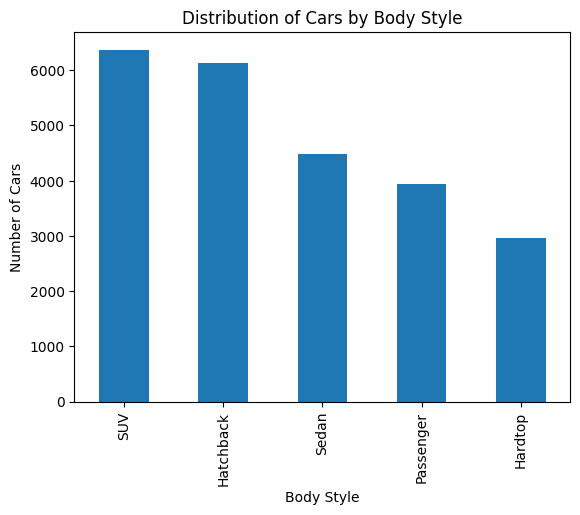

In [ ]:
plt.figure()
body_style_count.plot(kind='bar')
plt.ylabel("Number of Cars")
plt.title("Distribution of Cars by Body Style")
plt.show()


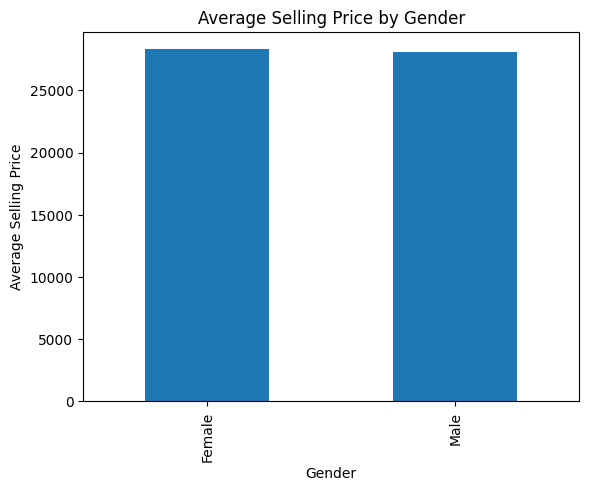

In [ ]:
#How does the average selling price of cars vary by customer gender and annual income

avg_price_gender = df.groupby('Gender')['Price ($)'].mean()
avg_price_gender
plt.figure()
avg_price_gender.plot(kind='bar')
plt.ylabel("Average Selling Price")
plt.title("Average Selling Price by Gender")
plt.show()



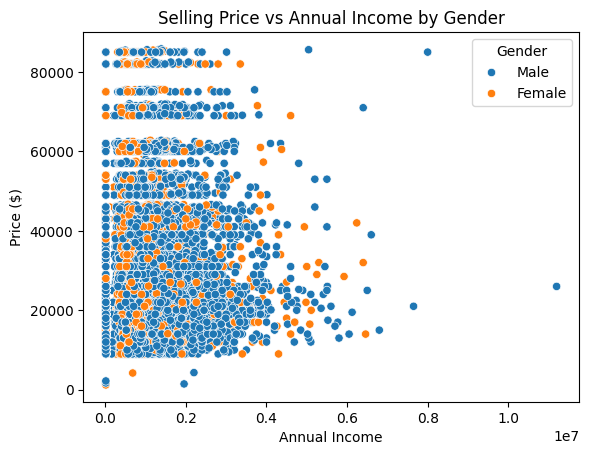

In [ ]:
plt.figure()
sns.scatterplot(x='Annual Income', y='Price ($)', hue='Gender', data=df)
plt.title("Selling Price vs Annual Income by Gender")
plt.show()


In [ ]:
df['Income_Group'] = pd.qcut(df['Annual Income'], q=4,
                             labels=['Low', 'Medium', 'High', 'Very High'])
gender_income_price = df.groupby(['Gender', 'Income_Group'])['Price ($)'].mean()
gender_income_price



Gender  Income_Group
Female  Low             28059.801521
        Medium          28353.154717
        High            28309.448449
        Very High       28402.914851
Male    Low             27924.524014
        Medium          27837.224550
        High            28283.473409
        Very High       28091.421784
Name: Price ($), dtype: float64

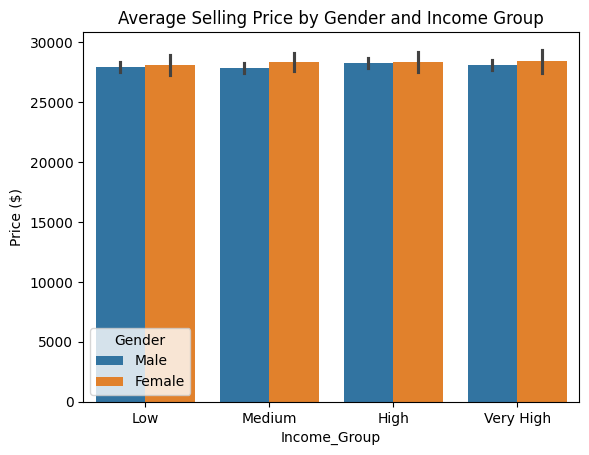

In [ ]:
plt.figure()
sns.barplot(x='Income_Group', y='Price ($)', hue='Gender', data=df)
plt.title("Average Selling Price by Gender and Income Group")
plt.show()


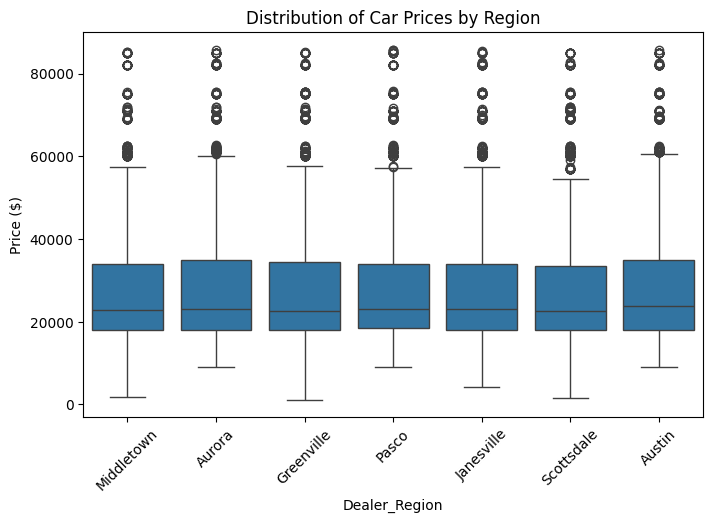

In [ ]:
# What is the distribution of car prices by region, and how does the number of cars sold vary by region


df.columns = df.columns.str.strip()

plt.figure(figsize=(8,5))
sns.boxplot(x='Dealer_Region', y='Price ($)', data=df)  # change name if needed
plt.xticks(rotation=45)
plt.title("Distribution of Car Prices by Region")
plt.show()



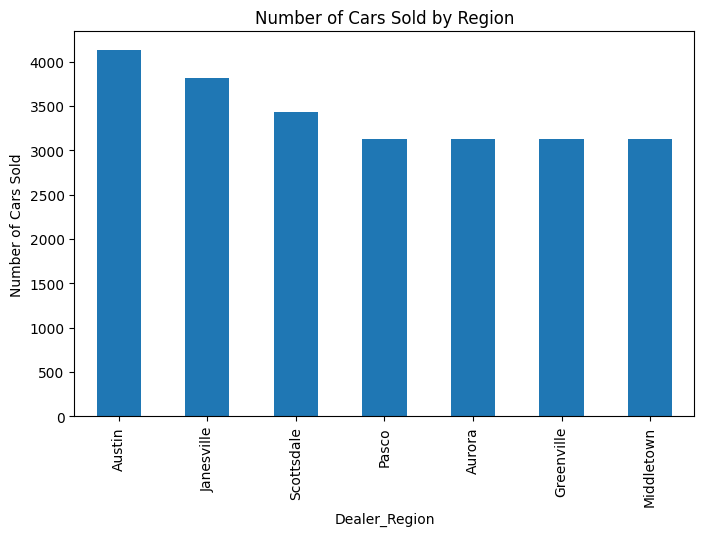

In [ ]:
#Number of Cars Sold by Region
region_sales = df['Dealer_Region'].value_counts()
region_sales
plt.figure(figsize=(8,5))
region_sales.plot(kind='bar')
plt.ylabel("Number of Cars Sold")
plt.title("Number of Cars Sold by Region")
plt.show()



In [ ]:
# How does the average car price differ between cars with different engine sizes
# Clean column names (important)
df.columns = df.columns.str.strip()

# Calculate average price by engine size
avg_price_engine = df.groupby('Engine')['Price ($)'].mean()

print(avg_price_engine)



Engine
DoubleÂ Overhead Camshaft    28248.525972
Overhead Camshaft            27914.710631
Name: Price ($), dtype: float64


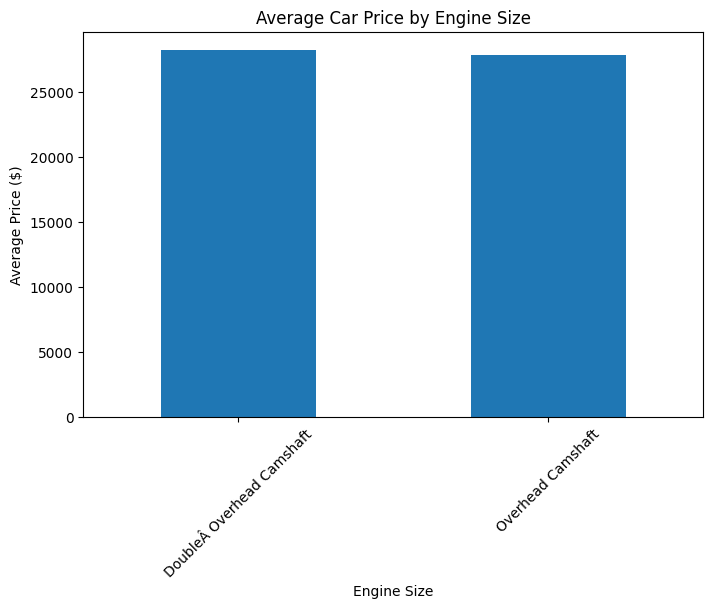

In [ ]:


avg_price_engine.plot(kind='bar', figsize=(8,5))
plt.title("Average Car Price by Engine Size")
plt.xlabel("Engine Size")
plt.ylabel("Average Price ($)")
plt.xticks(rotation=45)
plt.show()


In [ ]:
#  How do car prices vary based on the customer’s annual income bracket

df['Income Bracket'] = pd.cut(
    df['Annual Income'],
    bins=[0, 30000, 60000, 100000, 150000, df['Annual Income'].max()],
    labels=['Low', 'Lower-Middle', 'Middle', 'Upper-Middle', 'High']
)
avg_price_by_income = df.groupby('Income Bracket')['Price ($)'].mean()
print(avg_price_by_income)


Income Bracket
Low             27884.297820
Lower-Middle             NaN
Middle          43000.000000
Upper-Middle    23200.200000
High            28149.089557
Name: Price ($), dtype: float64


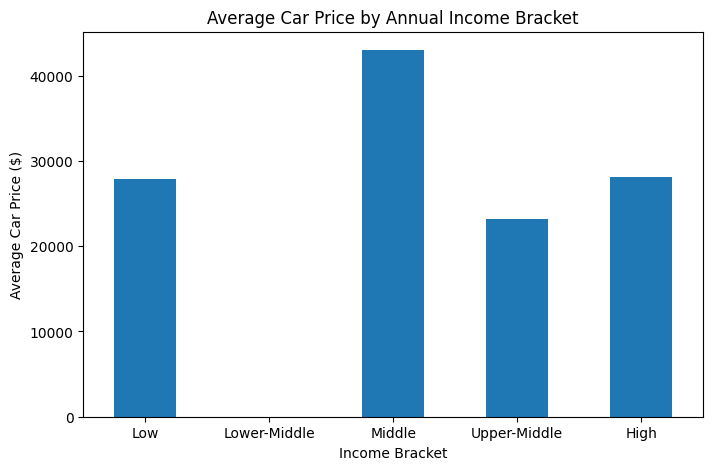

In [ ]:
avg_price_by_income.plot(kind='bar', figsize=(8,5))
plt.title("Average Car Price by Annual Income Bracket")
plt.xlabel("Income Bracket")
plt.ylabel("Average Car Price ($)")
plt.xticks(rotation=0)
plt.show()


In [ ]:
# What are the top 5 car models with the highest number of sales, and how does their price distribution look

top_models = df['Model'].value_counts().head(5)
top_models


,count
Model,
Diamante,418
Prizm,411
Silhouette,411
Passat,391
Ram Pickup,383


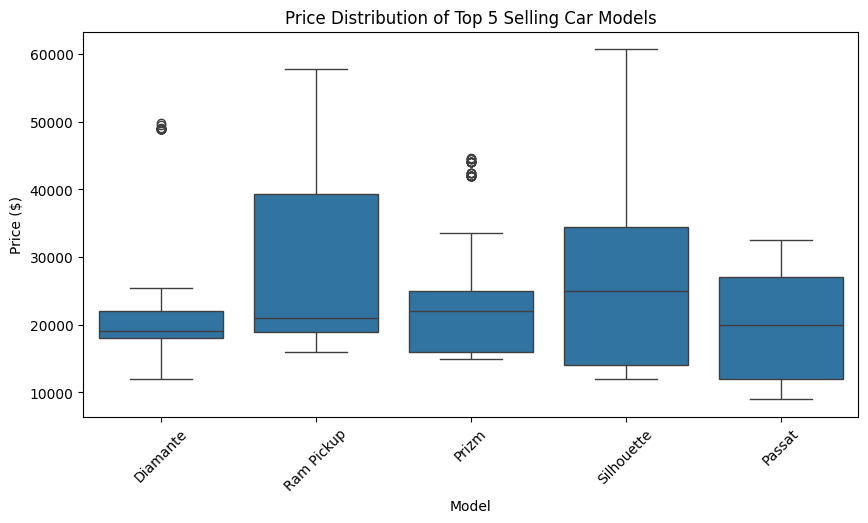

In [ ]:
top_model_names = top_models.index
top_model_data = df[df['Model'].isin(top_model_names)]
plt.figure(figsize=(10,5))
sns.boxplot(x='Model', y='Price ($)', data=top_model_data)
plt.title("Price Distribution of Top 5 Selling Car Models")
plt.xticks(rotation=45)
plt.show()



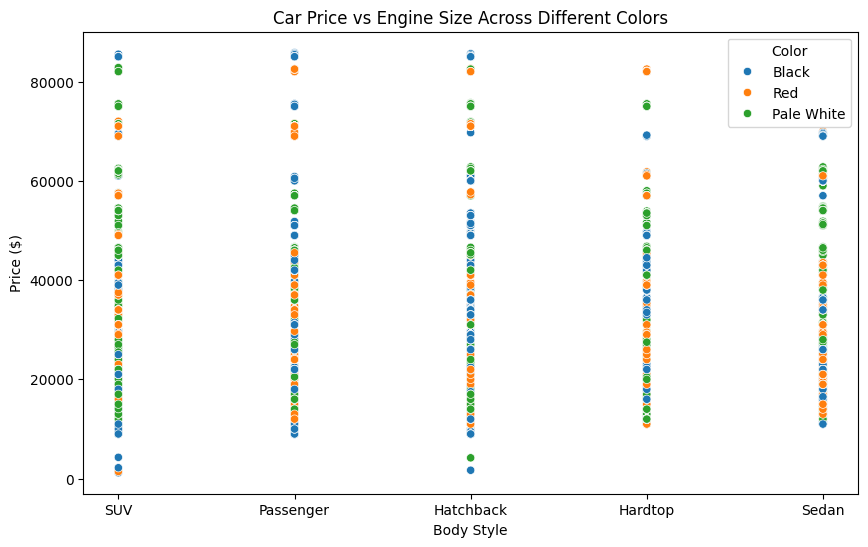

In [ ]:
# How does car price vary with engine size across different car colors, and which colors have the highest price
# variation
plt.figure(figsize=(10,6))
sns.scatterplot(
    data=df,
    x='Body Style',
    y='Price ($)',
    hue='Color'
)
plt.title("Car Price vs Engine Size Across Different Colors")
plt.show()


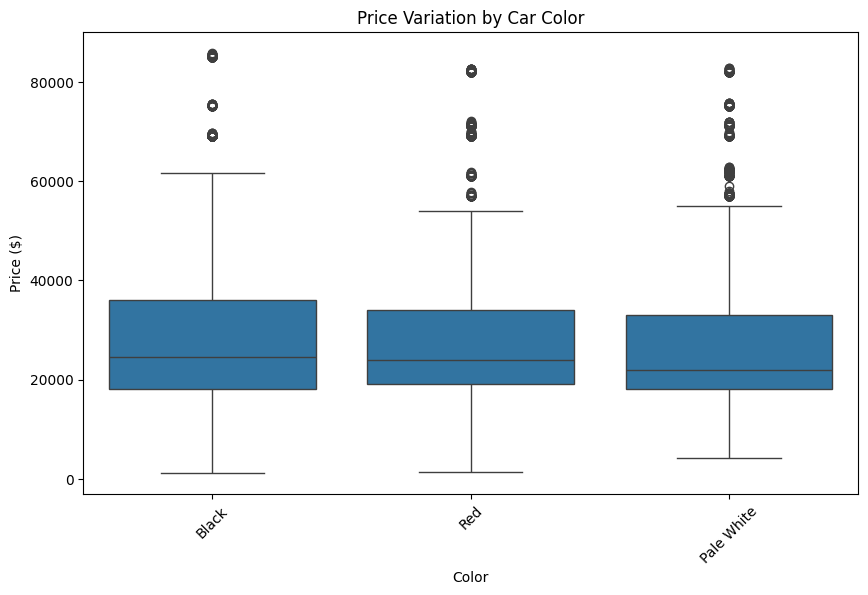

In [ ]:
plt.figure(figsize=(10,6))
sns.boxplot(x='Color', y='Price ($)', data=df)
plt.xticks(rotation=45)
plt.title("Price Variation by Car Color")
plt.show()


In [ ]:
price_variation = df.groupby('Color')['Price ($)'].agg(
    IQR=lambda x: x.quantile(0.75) - x.quantile(0.25)
)

price_variation.sort_values(by='IQR', ascending=False)


,IQR
Color,
Black,18000.0
Pale White,15000.0
Red,15000.0


In [ ]:
#  Is there any seasonal trend in car sales based on the date of sale
df['Date'] = pd.to_datetime(df['Date'])
df['Month'] = df['Date'].dt.month
df['Year'] = df['Date'].dt.year
monthly_sales = df.groupby('Month').size()
monthly_sales




,0
Month,
1,790
2,735
3,1535
4,1655
5,1895
6,1715
7,1725
8,1705
9,3305


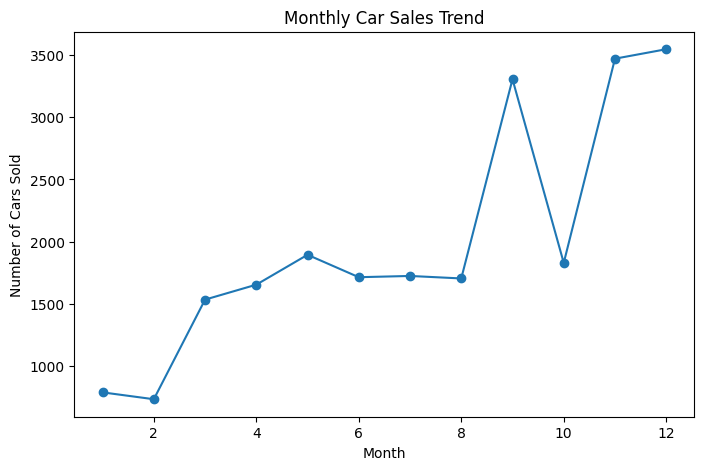

In [ ]:
plt.figure(figsize=(8,5))
monthly_sales.plot(kind='line', marker='o')
plt.xlabel('Month')
plt.ylabel('Number of Cars Sold')
plt.title('Monthly Car Sales Trend')
plt.show()


In [ ]:
df['Month Name'] = df['Date'].dt.month_name()

monthly_sales_name = df['Month Name'].value_counts().sort_index()
monthly_sales_name


,count
Month Name,
April,1655
August,1705
December,3546
February,735
January,790
July,1725
June,1715
March,1535
May,1895


In [ ]:
# How does the car price distribution change when considering different combinations of body style and
# transmission type

price_summary = df.groupby(['Body Style', 'Transmission'])['Price ($)'].describe()
price_summary


count          mean           std      min      25%  \
Body Style Transmission                                                         
Hardtop    Auto          1408.0  31520.188210  13687.756740  12000.0  21001.0   
           Manual        1563.0  27016.943698  14072.501848  11000.0  17575.5   
Hatchback  Auto          3458.0  25910.544824  13144.014337   4200.0  18001.0   
           Manual        2670.0  28702.550562  16284.049616   1700.0  17000.0   
Passenger  Auto          2020.0  28915.835149  13946.481932   9000.0  19000.0   
           Manual        1925.0  28969.521039  18523.684163  10000.0  16001.0   
SUV        Auto          3086.0  27501.404407  13299.927913   1200.0  19000.0   
           Manual        3288.0  26079.019161  14621.526541   2200.0  17000.0   
Sedan      Auto          2599.0  29955.294344  14310.910860  12000.0  19000.0   
           Manual        1889.0  29664.271572  15440.056434  11000.0  19001.0   

                             50%      75%      max  
Body Style Transmission                             
Hardtop    Auto          27000.0  43125.0  75501.0  
           Manual        22001.0  29000.0  82500.0  
Hatchback  Auto          21500.0  31000.0  75700.0  
           Manual        23000.0  36001.0  85600.0  
Passenger  Auto          25000.0  38000.0  69801.0  
           Manual        22000.0  37000.0  85800.0  
SUV        Auto          25000.0  33000.0  75501.0  
           Manual        22000.0  28000.0  85500.0  
Sedan      Auto          26000.0  39500.0  69980.0  
           Manual        25000.0  36600.0  69700.0

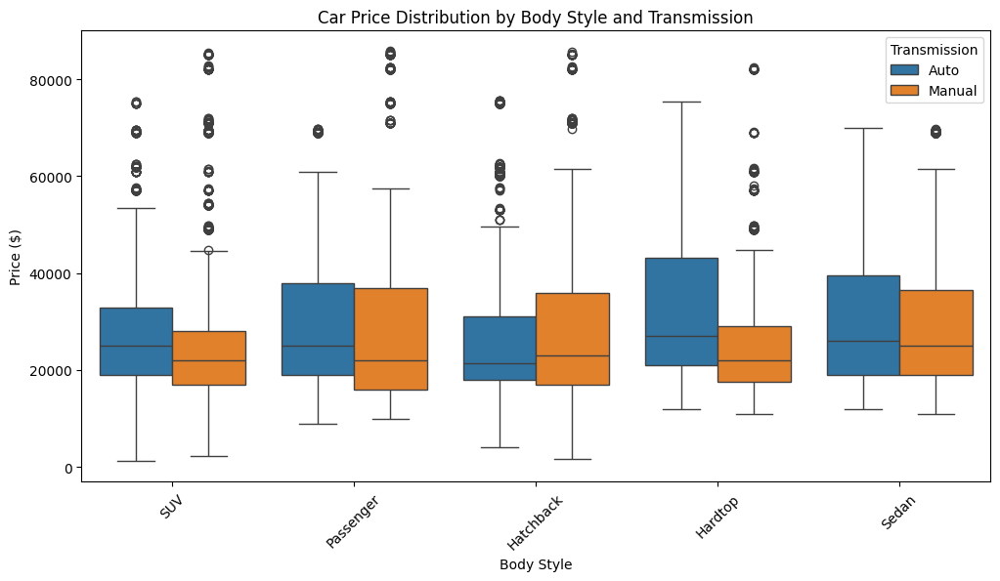

In [ ]:
plt.figure(figsize=(12,6))
sns.boxplot(
    x='Body Style',
    y='Price ($)',
    hue='Transmission',
    data=df
)
plt.xticks(rotation=45)
plt.title('Car Price Distribution by Body Style and Transmission')
plt.show()


In [ ]:
median_prices = df.groupby(['Body Style', 'Transmission'])['Price ($)'].median().unstack()
median_prices


Transmission,Auto,Manual
Body Style,,
Hardtop,27000.0,22001.0
Hatchback,21500.0,23000.0
Passenger,25000.0,22000.0
SUV,25000.0,22000.0
Sedan,26000.0,25000.0


In [ ]:
cols = ['Price ($)', 'Body Style', 'Annual Income']
df[cols] = df[cols].apply(pd.to_numeric, errors='coerce')


In [ ]:
correlation_matrix = df[cols].corr()
correlation_matrix


,Price ($),Body Style,Annual Income
Price ($),1.000000,NaN,0.012065
Body Style,NaN,NaN,NaN
Annual Income,0.012065,NaN,1.000000


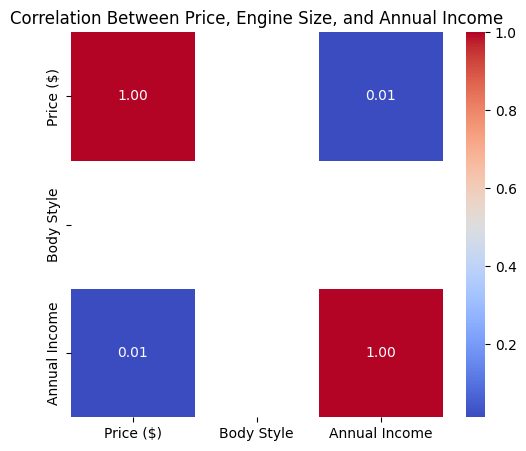

In [ ]:
plt.figure(figsize=(6,5))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Between Price, Engine Size, and Annual Income')
plt.show()


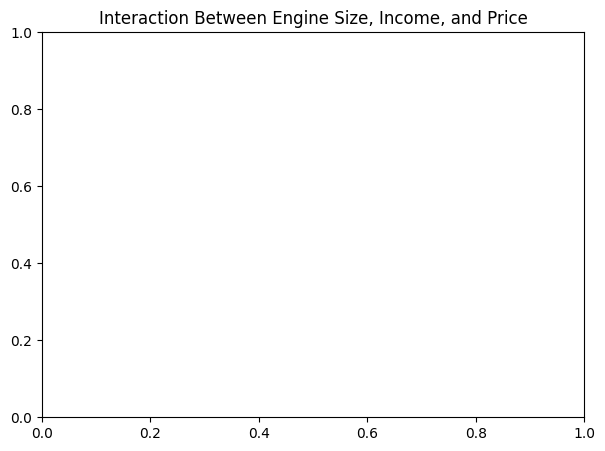

In [ ]:
plt.figure(figsize=(7,5))
sns.scatterplot(
    x='Body Style',
    y='Price ($)',
    hue='Annual Income',
    data=df,
    palette='viridis'
)
plt.title('Interaction Between Engine Size, Income, and Price')
plt.show()


In [ ]:
#How does the average car price vary across different car models and engine types?
df['Price ($)'] = pd.to_numeric(df['Price ($)'], errors='coerce')
avg_price_model = df.groupby('Model')['Price ($)'].mean().sort_values(ascending=False)
avg_price_model



,Price ($)
Model,
Catera,56836.933333
DeVille,46154.050000
Contour,45309.079646
Integra,44604.000000
Tacoma,44576.743017
...,...
Montero,16035.000000
C-Class,14538.414474
Escort,12901.092105


In [ ]:
avg_price_engine = df.groupby('Body Style')['Price ($)'].mean().sort_values(ascending=False)
avg_price_engine


,Price ($)
Body Style,
Sedan,29832.802807
Hardtop,29151.096600
Passenger,28942.031686
Hatchback,27127.035574
SUV,26767.673204


In [ ]:
avg_price_model_engine = (
    df.groupby(['Model', 'Body Style'])['Price ($)']
    .mean()
    .reset_index()
)

avg_price_model_engine


,Model,Body Style,Price ($)


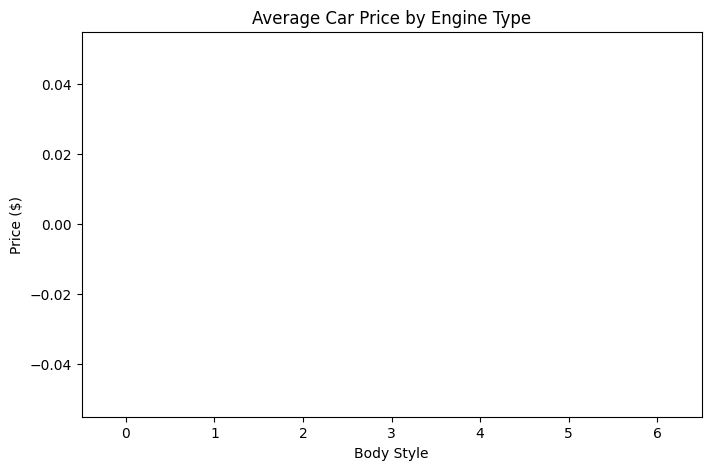

In [ ]:
plt.figure(figsize=(8,5))
sns.barplot(
    x='Body Style',
    y='Price ($)',
    data=df,
    estimator='mean'
)
plt.title('Average Car Price by Engine Type')
plt.show()


3. Amazon Sales Data

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')
from google.colab import files
files.upload()

Saving amazon.csv to amazon.csv


{'amazon.csv': b'product_id,product_name,category,discounted_price,actual_price,discount_percentage,rating,rating_count,about_product,user_id,user_name,review_id,review_title,review_content,img_link,product_link\nB07JW9H4J1,"Wayona Nylon Braided USB to Lightning Fast Charging and Data Sync Cable Compatible for iPhone 13, 12,11, X, 8, 7, 6, 5, iPad Air, Pro, Mini (3 FT Pack of 1, Grey)",Computers&Accessories|Accessories&Peripherals|Cables&Accessories|Cables|USBCables,\xe2\x82\xb9399,"\xe2\x82\xb91,099",64%,4.2,"24,269","High Compatibility : Compatible With iPhone 12, 11, X/XsMax/Xr ,iPhone 8/8 Plus,iPhone 7/7 Plus,iPhone 6s/6s Plus,iPhone 6/6 Plus,iPhone 5/5s/5c/se,iPad Pro,iPad Air 1/2,iPad mini 1/2/3,iPod nano7,iPod touch and more apple devices.|Fast Charge&Data Sync : It can charge and sync simultaneously at a rapid speed, Compatible with any charging adaptor, multi-port charging station or power bank.|Durability : Durable nylon braided design with premium aluminum housing and toughe

In [ ]:
df = pd.read_csv("amazon.csv")
df.head()

,product_id,product_name,category,discounted_price,actual_price,discount_percentage,rating,rating_count,about_product,user_id,user_name,review_id,review_title,review_content,img_link,product_link
0,B07JW9H4J1,Wayona Nylon Braided USB to Lightning Fast Cha...,Computers&Accessories|Accessories&Peripherals|...,₹399,"₹1,099",64%,4.2,"24,269",High Compatibility : Compatible With iPhone 12...,"AG3D6O4STAQKAY2UVGEUV46KN35Q,AHMY5CWJMMK5BJRBB...","Manav,Adarsh gupta,Sundeep,S.Sayeed Ahmed,jasp...","R3HXWT0LRP0NMF,R2AJM3LFTLZHFO,R6AQJGUP6P86,R1K...","Satisfied,Charging is really fast,Value for mo...",Looks durable Charging is fine tooNo complains...,https://m.media-amazon.com/images/W/WEBP_40237...,https://www.amazon.in/Wayona-Braided-WN3LG1-Sy...
1,B098NS6PVG,Ambrane Unbreakable 60W / 3A Fast Charging 1.5...,Computers&Accessories|Accessories&Peripherals|...,₹199,₹349,43%,4.0,"43,994","Compatible with all Type C enabled devices, be...","AECPFYFQVRUWC3KGNLJIOREFP5LQ,AGYYVPDD7YG7FYNBX...","ArdKn,Nirbhay kumar,Sagar Viswanathan,Asp,Plac...","RGIQEG07R9HS2,R1SMWZQ86XIN8U,R2J3Y1WL29GWDE,RY...","A Good Braided Cable for Your Type C Device,Go...",I ordered this cable to connect my phone to An...,https://m.media-amazon.com/images/W/WEBP_40237...,https://www.amazon.in/Ambrane-Unbreakable-Char...
2,B096MSW6CT,Sounce Fast Phone Charging Cable & Data Sync U...,Computers&Accessories|Accessories&Peripherals|...,₹199,"₹1,899",90%,3.9,"7,928",【 Fast Charger& Data Sync】-With built-in safet...,"AGU3BBQ2V2DDAMOAKGFAWDDQ6QHA,AESFLDV2PT363T2AQ...","Kunal,Himanshu,viswanath,sai niharka,saqib mal...","R3J3EQQ9TZI5ZJ,R3E7WBGK7ID0KV,RWU79XKQ6I1QF,R2...","Good speed for earlier versions,Good Product,W...","Not quite durable and sturdy,https://m.media-a...",https://m.media-amazon.com/images/W/WEBP_40237...,https://www.amazon.in/Sounce-iPhone-Charging-C...
3,B08HDJ86NZ,boAt Deuce USB 300 2 in 1 Type-C & Micro USB S...,Computers&Accessories|Accessories&Peripherals|...,₹329,₹699,53%,4.2,"94,363",The boAt Deuce USB 300 2 in 1 cable is compati...,"AEWAZDZZJLQUYVOVGBEUKSLXHQ5A,AG5HTSFRRE6NL3M5S...","Omkar dhale,JD,HEMALATHA,Ajwadh a.,amar singh ...","R3EEUZKKK9J36I,R3HJVYCLYOY554,REDECAZ7AMPQC,R1...","Good product,Good one,Nice,Really nice product...","Good product,long wire,Charges good,Nice,I bou...",https://m.media-amazon.com/images/I/41V5FtEWPk...,https://www.amazon.in/Deuce-300-Resistant-Tang...
4,B08CF3B7N1,Portronics Konnect L 1.2M Fast Charging 3A 8 P...,Computers&Accessories|Accessories&Peripherals|...,₹154,₹399,61%,4.2,"16,905",[CHARGE & SYNC FUNCTION]- This cable comes wit...,"AE3Q6KSUK5P75D5HFYHCRAOLODSA,AFUGIFH5ZAFXRDSZH...","rahuls6099,Swasat Borah,Ajay Wadke,Pranali,RVK...","R1BP4L2HH9TFUP,R16PVJEXKV6QZS,R2UPDB81N66T4P,R...","As good as original,Decent,Good one for second...","Bought this instead of original apple, does th...",https://m.media-amazon.com/images/W/WEBP_40237...,https://www.amazon.in/Portronics-Konnect-POR-1...


In [ ]:
# What is the average rating for each product category
price_cols = ['discounted_price', 'actual_price', 'rating', 'rating_count']
df[price_cols] = df[price_cols].apply(pd.to_numeric, errors='coerce')



In [ ]:
avg_rating_category = df.groupby('category')['rating'].mean().sort_values(ascending=False)
avg_rating_category


,rating
category,
Computers&Accessories|Tablets,4.6
Computers&Accessories|NetworkingDevices|NetworkAdapters|PowerLANAdapters,4.5
Electronics|Cameras&Photography|Accessories|Film,4.5
Computers&Accessories|Components|Memory,4.5
Electronics|HomeAudio|MediaStreamingDevices|StreamingClients,4.5
...,...
Computers&Accessories|Accessories&Peripherals|Audio&VideoAccessories|PCMicrophones,3.6
"Electronics|HomeTheater,TV&Video|Accessories|3DGlasses",3.5
Computers&Accessories|Accessories&Peripherals|Audio&VideoAccessories|PCHeadsets,3.5


In [ ]:
# What are the top rating_count products by category

top_products = (
    df.sort_values('rating_count', ascending=False)
      .groupby('category')
      .head(3)[['category', 'product_name', 'rating_count']]
)

top_products




,category,product_name,rating_count
1279,"Home&Kitchen|Kitchen&HomeAppliances|Vacuum,Cle...",Eureka Forbes car Vac 100 Watts Powerful Sucti...,992.0
750,Electronics|GeneralPurposeBatteries&BatteryCha...,Eveready Red 1012 AAA Batteries - Pack of 10,989.0
1059,Home&Kitchen|Kitchen&HomeAppliances|SmallKitch...,Pigeon 1.5 litre Hot Kettle and Stainless Stee...,976.0
823,Computers&Accessories|Accessories&Peripherals|...,Zoul USB C 60W Fast Charging 3A 6ft/2M Long Ty...,974.0
32,Computers&Accessories|Accessories&Peripherals|...,Zoul USB C 60W Fast Charging 3A 6ft/2M Long Ty...,974.0
...,...,...,...
1434,Home&Kitchen|Kitchen&HomeAppliances|SmallKitch...,Lifelong LLWM105 750-Watt Belgian Waffle Maker...,NaN
1439,"Home&Kitchen|Heating,Cooling&AirQuality|Fans|P...",AmazonBasics High Speed 55 Watt Oscillating Pe...,NaN
1444,"Home&Kitchen|Kitchen&HomeAppliances|Vacuum,Cle...",Eureka Forbes Euroclean Paper Vacuum Cleaner D...,NaN
1451,Home&Kitchen|Kitchen&HomeAppliances|SmallKitch...,"Bajaj HM-01 Powerful 250W Hand Mixer, Black",NaN


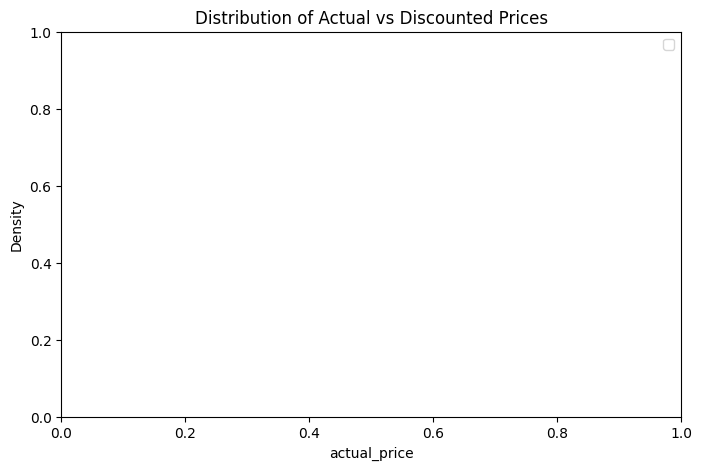

In [ ]:
# What is the distribution of discounted prices vs. actual prices
plt.figure(figsize=(8,5))
sns.kdeplot(df['actual_price'], label='Actual Price')
sns.kdeplot(df['discounted_price'], label='Discounted Price')
plt.legend()
plt.title('Distribution of Actual vs Discounted Prices')
plt.show()


In [ ]:
# How does the average discount percentage vary across categories

df['discount_percent'] = ((df['actual_price'] - df['discounted_price']) / df['actual_price']) * 100
avg_discount_category = df.groupby('category')['discount_percent'].mean().sort_values(ascending=False)
avg_discount_category


,discount_percent
category,
Car&Motorbike|CarAccessories|InteriorAccessories|AirPurifiers&Ionizers,NaN
Computers&Accessories|Accessories&Peripherals|Adapters|USBtoUSBAdapters,NaN
Computers&Accessories|Accessories&Peripherals|Audio&VideoAccessories|PCHeadsets,NaN
Computers&Accessories|Accessories&Peripherals|Audio&VideoAccessories|PCMicrophones,NaN
Computers&Accessories|Accessories&Peripherals|Audio&VideoAccessories|PCSpeakers,NaN
...,...
"OfficeProducts|OfficePaperProducts|Paper|Stationery|Pens,Pencils&WritingSupplies|Pens&Refills|GelInkRollerballPens",NaN
"OfficeProducts|OfficePaperProducts|Paper|Stationery|Pens,Pencils&WritingSupplies|Pens&Refills|LiquidInkRollerballPens",NaN
"OfficeProducts|OfficePaperProducts|Paper|Stationery|Pens,Pencils&WritingSupplies|Pens&Refills|RetractableBallpointPens",NaN


In [ ]:
# What are the most popular product names
df['product_name'].value_counts().head(10)


,count
product_name,
"Fire-Boltt Ninja Call Pro Plus 1.83"" Smart Watch with Bluetooth Calling, AI Voice Assistance, 100 Sports Modes IP67 Rating, 240*280 Pixel High Resolution",5
"Fire-Boltt Phoenix Smart Watch with Bluetooth Calling 1.3"",120+ Sports Modes, 240*240 PX High Res with SpO2, Heart Rate Monitoring & IP67 Rating",4
"Amazonbasics Nylon Braided Usb-C To Lightning Cable, Fast Charging Mfi Certified Smartphone, Iphone Charger (6-Foot, Dark Grey)",3
"Duracell USB Lightning Apple Certified (Mfi) Braided Sync & Charge Cable For Iphone, Ipad And Ipod. Fast Charging Lightning Cable, 3.9 Feet (1.2M) - Black",3
Flix Micro Usb Cable For Smartphone (Black),3
"Fire-Boltt India's No 1 Smartwatch Brand Talk 2 Bluetooth Calling Smartwatch with Dual Button, Hands On Voice Assistance, 60 Sports Modes, in Built Mic & Speaker with IP68 Rating",3
"Wayona Nylon Braided USB to Lightning Fast Charging and Data Sync Cable Compatible for iPhone 13, 12,11, X, 8, 7, 6, 5, iPad Air, Pro, Mini (3 FT Pack of 1, Grey)",3
"Ambrane Unbreakable 60W / 3A Fast Charging 1.5m Braided Type C Cable for Smartphones, Tablets, Laptops & other Type C devices, PD Technology, 480Mbps Data Sync, Quick Charge 3.0 (RCT15A, Black)",3
"Sounce Fast Phone Charging Cable & Data Sync USB Cable Compatible for iPhone 13, 12,11, X, 8, 7, 6, 5, iPad Air, Pro, Mini & iOS Devices",3


In [ ]:
#  What are the most popular product keywords
from collections import Counter

keywords = ' '.join(df['product_name'].dropna()).lower().split()
Counter(keywords).most_common(10)


[('with', 751),
 ('for', 672),
 ('|', 457),
 ('&', 432),
 ('usb', 377),
 ('and', 330),
 ('cable', 320),
 ('-', 220),
 ('charging', 219),
 ('to', 218)]

In [ ]:
# What are the most popular product reviews
df['review_title'].value_counts().head(10)


,count
review_title,
"Worked on iPhone 7 and didn’t work on XR,Good one,Dull Physical Looks,Just Buy it,Go for it,About the product,Get charging cable at the price,Working well.",10
"Satisfied,Charging is really fast,Value for money,Product review,Good quality,Good product,Good Product,As of now seems good",8
"Phone, camera, heating - works for me, may not for all,Good Mobile,Good but not excellent under this budget,Worth the price at 9499,Ok type phone... but unable to make videocall within same service provider.,Phone review,Budget king,Battery backup is good",8
"A Good Braided Cable for Your Type C Device,Good quality product from ambrane,Super cable,As,Good quality,Good product,its good,Good quality for the price but one issue with my unit",7
"Good product,Good one,Nice,Really nice product,Very first time change,Good,Fine product but could be better,Very nice it's charging like jet",7
"Above average phone,Worth For The Money 💰,Okie,Phone is excellent,Purchased in good budget at 12k,It can fulfill basic needs in affordable price range,Nice,About features",6
"Fake Product,Costly but excellent quality,Storage good but don't know how to Activate warantee??,Good for use,5 stas nahi diya kyuki capacity 477gb hi rahta hai,Speed not as advertise,Good one,It's ok",6
"The metal pin is losing it's strength,Sahi h bs 44 rupe ki and dilivery charge 40,Good Charging cable,Good sturdy micro usb cable with good charging speeds,Cheapest micro USB cable in the market,boat is better than this,I bought this for 199rs best charging cable for all mobiles,Good",5
"GOOD,Thank you Amazon very good charging cable,Good,Very good product,good quality,Very Good Product,This is fast charging USB!,Simply perfect at the price of below 100",5


In [ ]:
# What is the correlation between discounted_price and rating
df[['discounted_price', 'rating']].corr()


,discounted_price,rating
discounted_price,NaN,NaN
rating,NaN,1.0


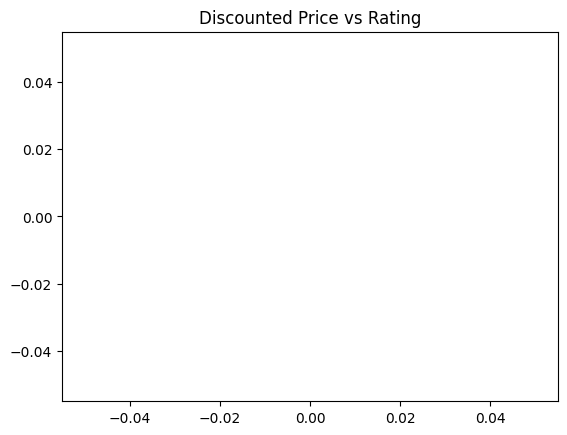

In [ ]:
sns.scatterplot(x='discounted_price', y='rating', data=df)
plt.title('Discounted Price vs Rating')
plt.show()


In [ ]:
#  What are the Top 5 categories based on the highest ratings
top_5_categories = avg_rating_category.head(5)
top_5_categories


,rating
category,
Computers&Accessories|Tablets,4.6
Computers&Accessories|NetworkingDevices|NetworkAdapters|PowerLANAdapters,4.5
Electronics|Cameras&Photography|Accessories|Film,4.5
Computers&Accessories|Components|Memory,4.5
Electronics|HomeAudio|MediaStreamingDevices|StreamingClients,4.5


Identify any potential areas for improvement or optimization based on the data analysis.

-> Some categories have high discounts but low ratings → quality issues

* Products with high rating_count but medium ratings → scope for improvement

* Overused keywords → opportunity for SEO diversification

* Weak correlation between price & rating → focus on product quality, not price cuts

EDA-4 : Spotify Data-Popular Hip-Hop Artists and Tracks

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')
from google.colab import files
files.upload()

Saving spotify.csv to spotify.csv


{'spotify.csv': b'Artist,Track Name,Popularity,Duration (ms),Track ID\r\nDrake,Rich Baby Daddy (feat. Sexyy Red & SZA),92,319191,1yeB8MUNeLo9Ek1UEpsyz6\r\nDrake,One Dance,91,173986,1zi7xx7UVEFkmKfv06H8x0\r\nDrake,IDGAF (feat. Yeat),90,260111,2YSzYUF3jWqb9YP9VXmpjE\r\nDrake,First Person Shooter (feat. J. Cole),88,247444,7aqfrAY2p9BUSiupwk3svU\r\nDrake,Jimmy Cooks (feat. 21 Savage),88,218364,3F5CgOj3wFlRv51JsHbxhe\r\nDrake,God\'s Plan,87,198973,6DCZcSspjsKoFjzjrWoCdn\r\nDrake,Passionfruit,86,298940,5mCPDVBb16L4XQwDdbRUpz\r\nTravis Scott,MELTDOWN (feat. Drake),86,246133,67nepsnrcZkowTxMWigSbb\r\nDrake,Fair Trade (with Travis Scott),85,291175,40iJIUlhi6renaREYGeIDS\r\nDrake,Rich Flex,85,239359,1bDbXMyjaUIooNwFE9wn0N\r\nPost Malone,Sunflower - Spider-Man: Into the Spider-Verse,87,157560,0RiRZpuVRbi7oqRdSMwhQY\r\nPost Malone,Circles,88,215280,21jGcNKet2qwijlDFuPiPb\r\nNoah Kahan,Dial Drunk (with Post Malone),86,213817,22VHOlVYBqytsrAqV8yXBK\r\nPost Malone,Chemical,85,184013,5w40ZYhbBMAlHYNDa

In [3]:
df = pd.read_csv("spotify.csv")
df.head()

,Artist,Track Name,Popularity,Duration (ms),Track ID
0,Drake,Rich Baby Daddy (feat. Sexyy Red & SZA),92,319191,1yeB8MUNeLo9Ek1UEpsyz6
1,Drake,One Dance,91,173986,1zi7xx7UVEFkmKfv06H8x0
2,Drake,IDGAF (feat. Yeat),90,260111,2YSzYUF3jWqb9YP9VXmpjE
3,Drake,First Person Shooter (feat. J. Cole),88,247444,7aqfrAY2p9BUSiupwk3svU
4,Drake,Jimmy Cooks (feat. 21 Savage),88,218364,3F5CgOj3wFlRv51JsHbxhe


In [4]:
df.info() # Check Dataset Info


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440 entries, 0 to 439
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Artist         440 non-null    object
 1   Track Name     440 non-null    object
 2   Popularity     440 non-null    int64 
 3   Duration (ms)  440 non-null    int64 
 4   Track ID       440 non-null    object
dtypes: int64(2), object(3)
memory usage: 17.3+ KB


In [5]:
df.isnull().sum() #Check for Null Values


,0
Artist,0
Track Name,0
Popularity,0
Duration (ms),0
Track ID,0


In [7]:
df = df.dropna()


In [ ]:
# Fill numeric columns with mean
df.fillna(df.mean(numeric_only=True), inplace=True)

# Fill categorical columns with mode
for col in df.select_dtypes(include='object'):
    df[col].fillna(df[col].mode()[0], inplace=True)


In [ ]:
df.duplicated().sum() # Check Duplicate Rows


In [ ]:
df = df.drop_duplicates() #Check Duplicate Rows


In [ ]:
df = df.drop_duplicates() # Remove Duplicate Rows (If Present)


In [ ]:
df.isnull().sum()
df.duplicated().sum()
df.shape


2.What is the distribution of popularity among the tracks in the dataset? Visualize it using a histogram

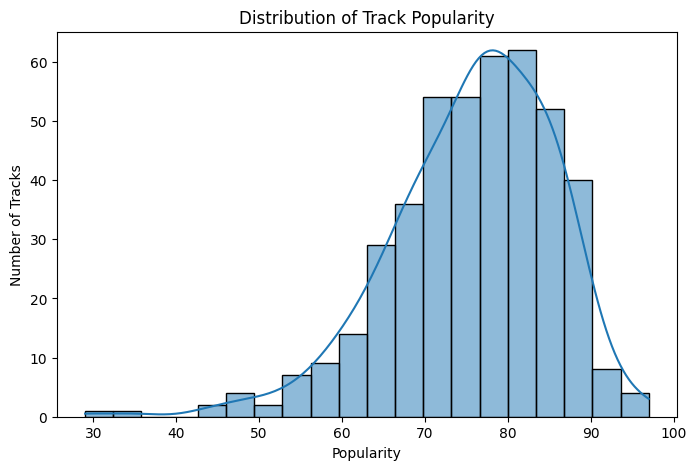

In [10]:
plt.figure(figsize=(8,5))
sns.histplot(df['Popularity'], bins=20, kde=True)
plt.xlabel('Popularity')
plt.ylabel('Number of Tracks')
plt.title('Distribution of Track Popularity')
plt.show()


3. Is there any relationship between the popularity and the duration of tracks? Explore this using a scatter plot

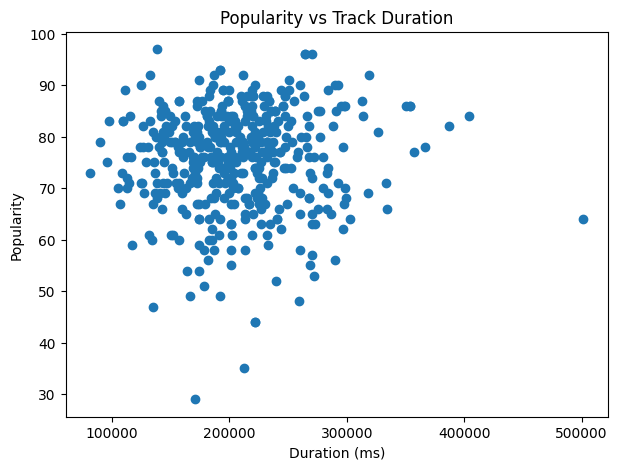

In [12]:
plt.figure(figsize=(7,5))
plt.scatter(df['Duration (ms)'], df['Popularity'])
plt.xlabel('Duration (ms)')
plt.ylabel('Popularity')
plt.title('Popularity vs Track Duration')
plt.show()


4. Which artist has the highest number of tracks in the dataset? Display the count of tracks for each artist using
a countplot

In [14]:
artist_counts = df['Artist'].value_counts()
artist_counts.head(10)


,count
Artist,
Drake,20
Travis Scott,12
21 Savage,11
Lil Nas X,11
Eminem,11
¥$,11
JAY-Z,10
Lil Baby,10
Ludacris,10


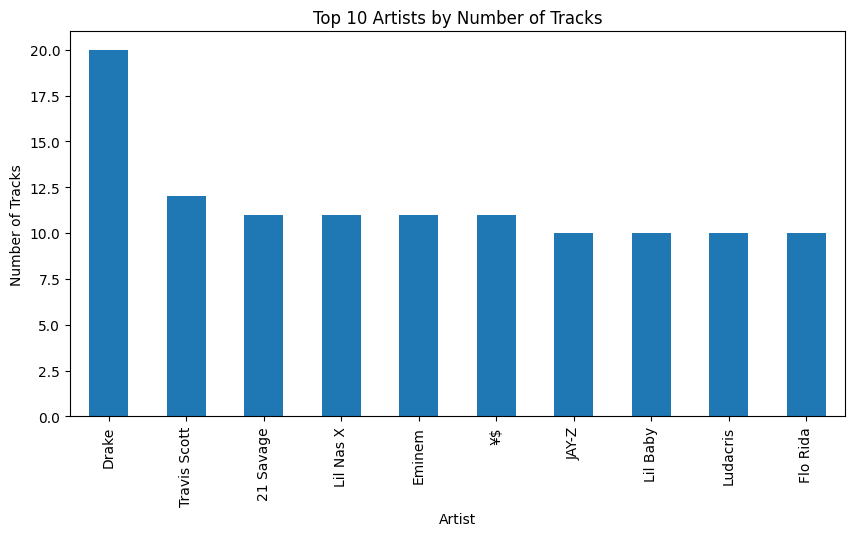

In [15]:
plt.figure(figsize=(10,5))
artist_counts.head(10).plot(kind='bar')
plt.xlabel('Artist')
plt.ylabel('Number of Tracks')
plt.title('Top 10 Artists by Number of Tracks')
plt.show()


5. What are the top 5 least popular tracks in the dataset? Provide the artist name and track name for each

In [16]:
df.columns


Index(['Artist', 'Track Name', 'Popularity', 'Duration (ms)', 'Track ID'], dtype='object')

In [18]:
least_popular_tracks = (
    df.sort_values(by='Popularity', ascending=True)
      .loc[:, ['Track Name', 'Artist', 'Popularity']]
      .head(5)
)

least_popular_tracks


,Track Name,Artist,Popularity
207,Attachments (feat. Coi Leray),Pressa,29
231,Intentions,Justin Bieber,35
413,Splash Brothers,French Montana,44
435,Splash Brothers,French Montana,44
225,On Me - Remix,Lil Baby,47


6. Among the top 5 most popular artists, which artist has the highest popularity on average? Calculate and
display the average popularity for each artist

In [20]:
top_5_artists = (
    df.groupby('Artist')['Popularity']
      .mean()
      .sort_values(ascending=False)
      .head(5)
)

top_5_artists


,Popularity
Artist,
cassö,92.000000
Trueno,89.000000
David Guetta,87.000000
Travis Scott,87.000000
¥$,86.090909


In [21]:
top_5_artists_df = top_5_artists.reset_index()
top_5_artists_df.columns = ['Artist Name', 'Average Popularity']
top_5_artists_df


,Artist Name,Average Popularity
0,cassö,92.000000
1,Trueno,89.000000
2,David Guetta,87.000000
3,Travis Scott,87.000000
4,¥$,86.090909


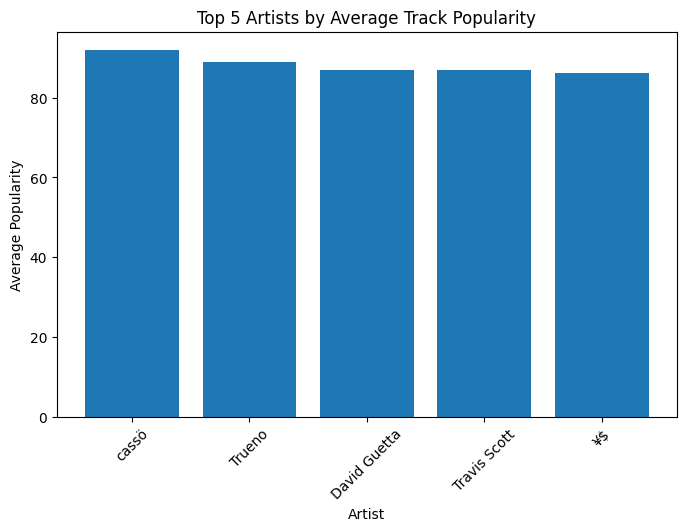

In [23]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
plt.bar(top_5_artists_df['Artist Name'], top_5_artists_df['Average Popularity'])
plt.xlabel('Artist')
plt.ylabel('Average Popularity')
plt.title('Top 5 Artists by Average Track Popularity')
plt.xticks(rotation=45)
plt.show()



7.For the top 5 most popular artists, what are their most popular tracks? List the track name for each artist

In [30]:
top_5_artists = (
    df.groupby('Artist')['Popularity']
      .mean()
      .sort_values(ascending=False)
      .head(5)
      .index
)



In [31]:
top_tracks = (
    df[df['Artist'].isin(top_5_artists)]
    .sort_values(['Artist', 'Popularity'], ascending=[True, False])
    .groupby('Artist')
    .head(1)[['Artist', 'Track Name', 'Popularity']]
)

top_tracks


,Artist,Track Name,Popularity
200,David Guetta,Baby Don't Hurt Me,87
30,Travis Scott,FE!N (feat. Playboi Carti),93
241,Trueno,Mamichula - con Nicki Nicole,89
140,cassö,Prada,92
260,¥$,CARNIVAL,96


8.  Visualize relationships between multiple numerical variables simultaneously using a pair plot

In [32]:
df.columns


Index(['Artist', 'Track Name', 'Popularity', 'Duration (ms)', 'Track ID'], dtype='object')

In [38]:
num_cols = [
    'Popularity',
    'Duration (ms)',

]


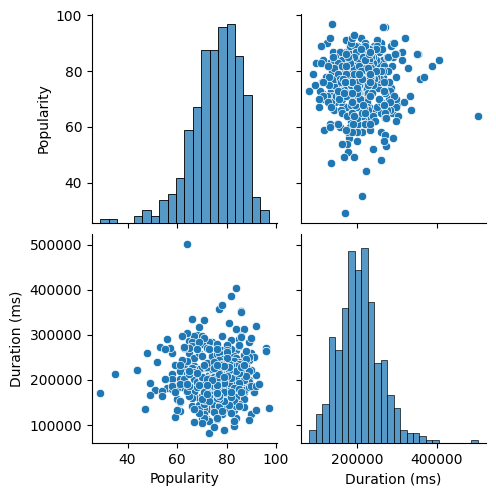

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.pairplot(df[num_cols])
plt.show()


9. Does the duration of tracks vary significantly across different artists? Explore this visually using a box plot or
violin plot

In [42]:
df = df.dropna(subset=['Artist', 'Duration (ms)'])
df['Duration (ms)'] = pd.to_numeric(df['Duration (ms)'], errors='coerce')


In [44]:
top_artists = df['Artist'].value_counts().head(10).index
df_top = df[df['Artist'].isin(top_artists)]


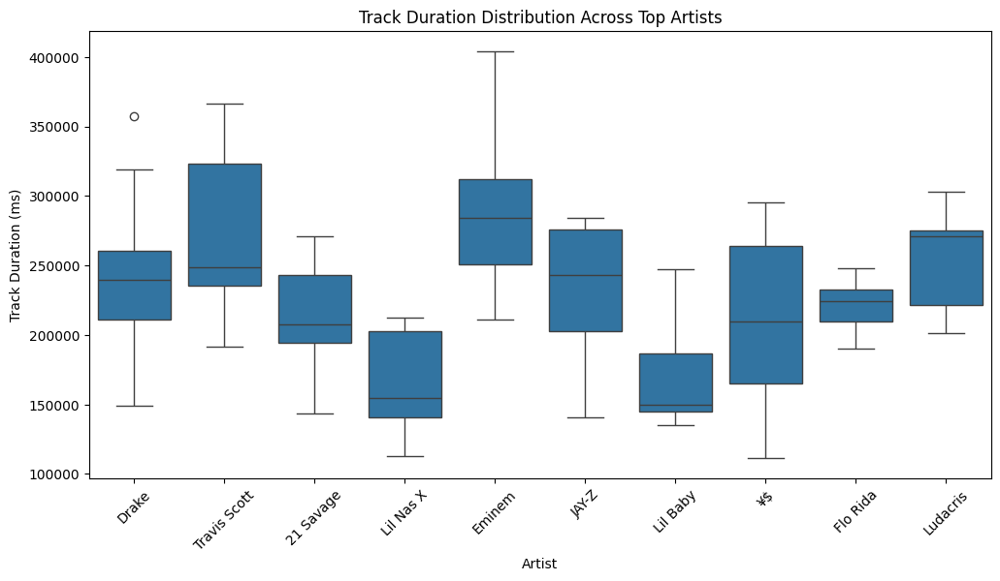

In [46]:
plt.figure(figsize=(12,6))
sns.boxplot(
    x='Artist',
    y='Duration (ms)',
    data=df_top
)
plt.xticks(rotation=45)
plt.xlabel('Artist')
plt.ylabel('Track Duration (ms)')
plt.title('Track Duration Distribution Across Top Artists')
plt.show()


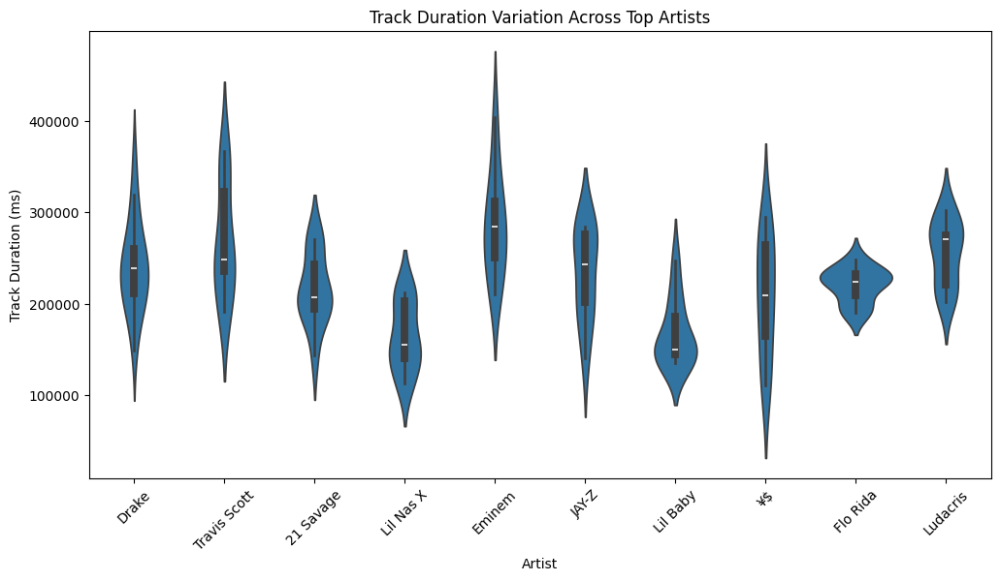

In [48]:
plt.figure(figsize=(12,6))
sns.violinplot(
    x='Artist',
    y='Duration (ms)',
    data=df_top
)
plt.xticks(rotation=45)
plt.xlabel('Artist')
plt.ylabel('Track Duration (ms)')
plt.title('Track Duration Variation Across Top Artists')
plt.show()


10. How does the distribution of track popularity vary for different artists? Visualize this using a swarm plot or a
violin plot.

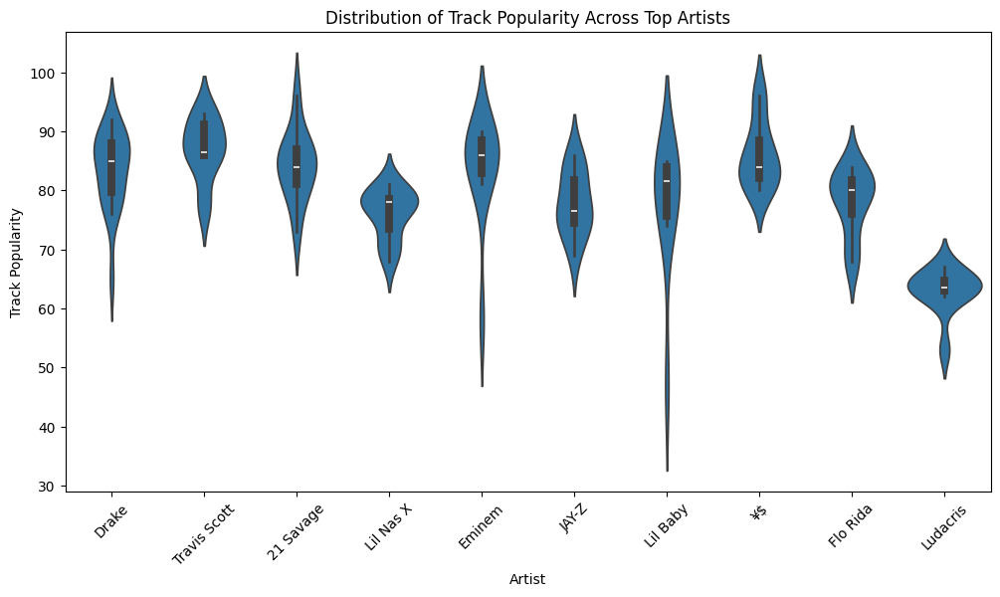

In [50]:
plt.figure(figsize=(12,6))
sns.violinplot(
    x='Artist',
    y='Popularity',
    data=df_top
)
plt.xticks(rotation=45)
plt.xlabel('Artist')
plt.ylabel('Track Popularity')
plt.title('Distribution of Track Popularity Across Top Artists')
plt.show()


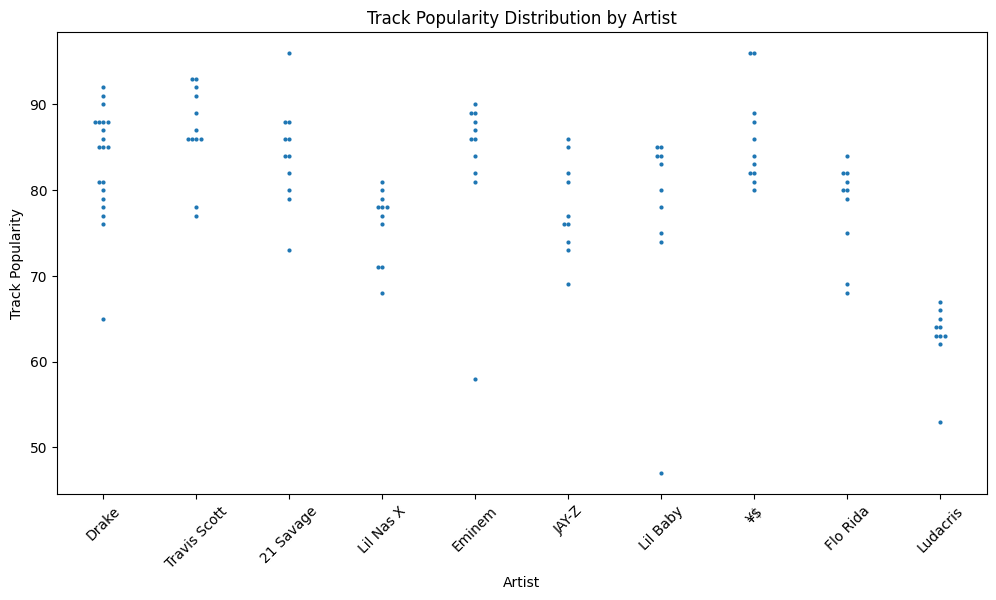

In [51]:
plt.figure(figsize=(12,6))
sns.swarmplot(
    x='Artist',
    y='Popularity',
    data=df_top,
    size=3
)
plt.xticks(rotation=45)
plt.xlabel('Artist')
plt.ylabel('Track Popularity')
plt.title('Track Popularity Distribution by Artist')
plt.show()
